## Initial Vehicles Data Info

In [2]:
import pandas as pd
import plotly.express as px


In [3]:
df=pd.read_csv('../vehicles_us.csv')

In [4]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51525 entries, 0 to 51524
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   price         51525 non-null  int64  
 1   model_year    47906 non-null  float64
 2   model         51525 non-null  object 
 3   condition     51525 non-null  object 
 4   cylinders     46265 non-null  float64
 5   fuel          51525 non-null  object 
 6   odometer      43633 non-null  float64
 7   transmission  51525 non-null  object 
 8   type          51525 non-null  object 
 9   paint_color   42258 non-null  object 
 10  is_4wd        25572 non-null  float64
 11  date_posted   51525 non-null  object 
 12  days_listed   51525 non-null  int64  
dtypes: float64(4), int64(2), object(7)
memory usage: 5.1+ MB


In [5]:
df.head(10)

,price,model_year,model,condition,cylinders,fuel,odometer,transmission,type,paint_color,is_4wd,date_posted,days_listed
0,9400,2011.0,bmw x5,good,6.0,gas,145000.0,automatic,SUV,NaN,1.0,2018-06-23,19
1,25500,NaN,ford f-150,good,6.0,gas,88705.0,automatic,pickup,white,1.0,2018-10-19,50
2,5500,2013.0,hyundai sonata,like new,4.0,gas,110000.0,automatic,sedan,red,NaN,2019-02-07,79
3,1500,2003.0,ford f-150,fair,8.0,gas,NaN,automatic,pickup,NaN,NaN,2019-03-22,9
4,14900,2017.0,chrysler 200,excellent,4.0,gas,80903.0,automatic,sedan,black,NaN,2019-04-02,28
5,14990,2014.0,chrysler 300,excellent,6.0,gas,57954.0,automatic,sedan,black,1.0,2018-06-20,15
6,12990,2015.0,toyota camry,excellent,4.0,gas,79212.0,automatic,sedan,white,NaN,2018-12-27,73
7,15990,2013.0,honda pilot,excellent,6.0,gas,109473.0,automatic,SUV,black,1.0,2019-01-07,68
8,11500,2012.0,kia sorento,excellent,4.0,gas,104174.0,automatic,SUV,NaN,1.0,2018-07-16,19
9,9200,2008.0,honda pilot,excellent,NaN,gas,147191.0,automatic,SUV,blue,1.0,2019-02-15,17


### Observation

- There are some missing data in some of the columns which we will need to clean up beforehand.

# Cleaning up the data

### Checking for duplicates

In [9]:
# Check for obvious duplicates
duplicates = df.duplicated()
print(f'Number of duplicate rows: {duplicates.sum()}')

Number of duplicate rows: 0


In [10]:
# Check for implicit duplicates (same car model with different casing, spaces, etc.)
df['model'] = df['model'].str.lower().str.strip()

df['model'].sort_values().unique()

array(['acura tl', 'bmw x5', 'buick enclave', 'cadillac escalade',
       'chevrolet camaro', 'chevrolet camaro lt coupe 2d',
       'chevrolet colorado', 'chevrolet corvette', 'chevrolet cruze',
       'chevrolet equinox', 'chevrolet impala', 'chevrolet malibu',
       'chevrolet silverado', 'chevrolet silverado 1500',
       'chevrolet silverado 1500 crew', 'chevrolet silverado 2500hd',
       'chevrolet silverado 3500hd', 'chevrolet suburban',
       'chevrolet tahoe', 'chevrolet trailblazer', 'chevrolet traverse',
       'chrysler 200', 'chrysler 300', 'chrysler town & country',
       'dodge charger', 'dodge dakota', 'dodge grand caravan',
       'ford econoline', 'ford edge', 'ford escape', 'ford expedition',
       'ford explorer', 'ford f-150', 'ford f-250', 'ford f-250 sd',
       'ford f-250 super duty', 'ford f-350 sd', 'ford f150',
       'ford f150 supercrew cab xlt', 'ford f250', 'ford f250 super duty',
       'ford f350', 'ford f350 super duty', 'ford focus', 'ford focus

In [11]:
# Standardize the model names
model_replacements = {
    'ford f150': 'ford f-150',
    'ford f-250': 'ford f-250',
    'ford f250': 'ford f-250',
    'ford f-250 sd': 'ford f-250',
    'ford f-250 super duty': 'ford f-250',
    'ford f250 super duty': 'ford f-250',
    'ford f-350 sd': 'ford f-350',
    'ford f350': 'ford f-350',
    'ford f-350 super duty': 'ford f-350',
    'ford f350 super duty': 'ford f-350'
}

df['model'] = df['model'].replace(model_replacements)

In [12]:
# Display the unique values after standardization to verify
print("Unique model names after standardization:")
print(df['model'].sort_values().unique())

Unique model names after standardization:
['acura tl' 'bmw x5' 'buick enclave' 'cadillac escalade'
 'chevrolet camaro' 'chevrolet camaro lt coupe 2d' 'chevrolet colorado'
 'chevrolet corvette' 'chevrolet cruze' 'chevrolet equinox'
 'chevrolet impala' 'chevrolet malibu' 'chevrolet silverado'
 'chevrolet silverado 1500' 'chevrolet silverado 1500 crew'
 'chevrolet silverado 2500hd' 'chevrolet silverado 3500hd'
 'chevrolet suburban' 'chevrolet tahoe' 'chevrolet trailblazer'
 'chevrolet traverse' 'chrysler 200' 'chrysler 300'
 'chrysler town & country' 'dodge charger' 'dodge dakota'
 'dodge grand caravan' 'ford econoline' 'ford edge' 'ford escape'
 'ford expedition' 'ford explorer' 'ford f-150' 'ford f-250' 'ford f-350'
 'ford f150 supercrew cab xlt' 'ford focus' 'ford focus se' 'ford fusion'
 'ford fusion se' 'ford mustang' 'ford mustang gt coupe 2d' 'ford ranger'
 'ford taurus' 'gmc acadia' 'gmc sierra' 'gmc sierra 1500'
 'gmc sierra 2500hd' 'gmc yukon' 'honda accord' 'honda civic'
 'hond

### Observation
- The duplicated data is cleaned.

### Checking for missing values

In [15]:
# Display the number of missing values in each column
print("Missing values in each column:")
print(df.isnull().sum())

Missing values in each column:
price               0
model_year       3619
model               0
condition           0
cylinders        5260
fuel                0
odometer         7892
transmission        0
type                0
paint_color      9267
is_4wd          25953
date_posted         0
days_listed         0
dtype: int64


In [16]:
# Handle missing values
df['model_year'] = df['model_year'].fillna(df['model_year'].median())
df['cylinders'] = df['cylinders'].fillna(df['cylinders'].mode()[0])
df['odometer'] = df['odometer'].fillna(df['odometer'].median())
df['paint_color'] = df['paint_color'].fillna('unknown')
df['is_4wd'] = df['is_4wd'].fillna(0)

In [17]:
# Convert 'model_year' to integer type
df['model_year'] = df['model_year'].astype(int)

In [18]:
# Verify no missing values remain
print("Missing values after cleanup:")
print(df.isnull().sum())

Missing values after cleanup:
price           0
model_year      0
model           0
condition       0
cylinders       0
fuel            0
odometer        0
transmission    0
type            0
paint_color     0
is_4wd          0
date_posted     0
days_listed     0
dtype: int64


### Observation

- The missing values in the columns 'model_year' and 'odometer' have been replaced with the median value.

- The missing values in the column 'cylinders' have been replaced with the mode value.
  
- The missing values in the column 'paint_color' have been replaced with 'unknown'.

- The missing values in the column 'is_4wd' were replaced with 0.

**Convert 'date_posted' to datetime format**

In [21]:
df['date_posted'] = pd.to_datetime(df['date_posted'])

### Save the data to a new csv

In [23]:
# Save the cleaned dataset
cleaned_csv_path = '../vehicles_us_cleaned.csv'
df.to_csv(cleaned_csv_path, index=False)
print(f"Cleaned data saved to {cleaned_csv_path}")

Cleaned data saved to ../vehicles_us_cleaned.csv


### Histograms

**Distribution of Car Prices**

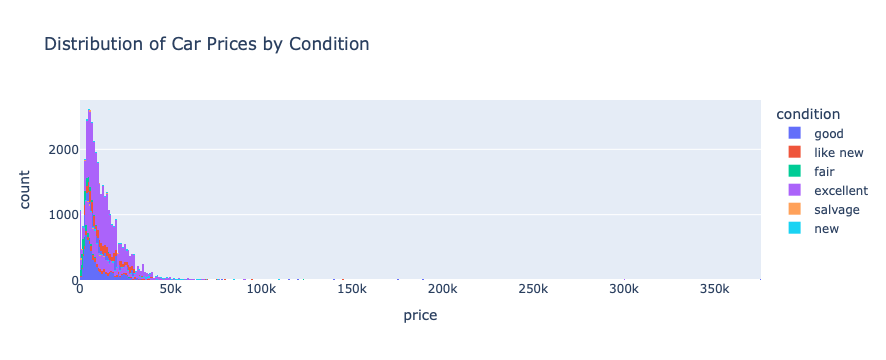

In [26]:
fig_price = px.histogram(df, x='price', color='condition', hover_data=df.columns, title='Distribution of Car Prices by Condition')
fig_price.update_xaxes(categoryorder='total descending')
fig_price.show()

### Observation:
- The majority of car prices are clustered in the lower price range.
- Different conditions of cars are visible, with "good" condition cars being the most frequent.
- There are fewer cars in "new" and "like new" conditions compared to "good" and "fair" conditions.
- The distribution of prices is skewed to the right, indicating that most cars are priced below 50k.

**Distribution of Car Model Years**

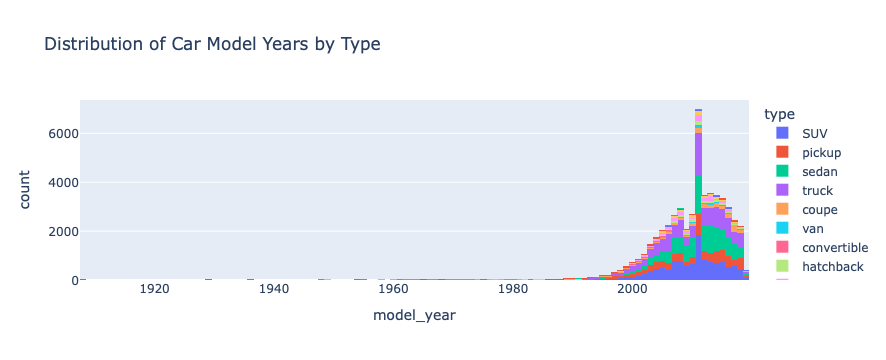

In [28]:
fig_model_year = px.histogram(df, x='model_year', color='type', hover_data=df.columns, title='Distribution of Car Model Years by Type')
fig_model_year.update_xaxes(categoryorder='total descending')
fig_model_year.show()

### Observation:
- The majority of car model years are recent, mostly from the 2000s onwards.
- Different types of vehicles, such as SUVs, sedans, and trucks, show a diverse range of model years.
- SUVs, pickups, and sedans are the most common types in recent model years.
- There is a noticeable increase in the number of cars from the 1990s and 2000s.

### Scatterplots

**Price vs. Odometer**

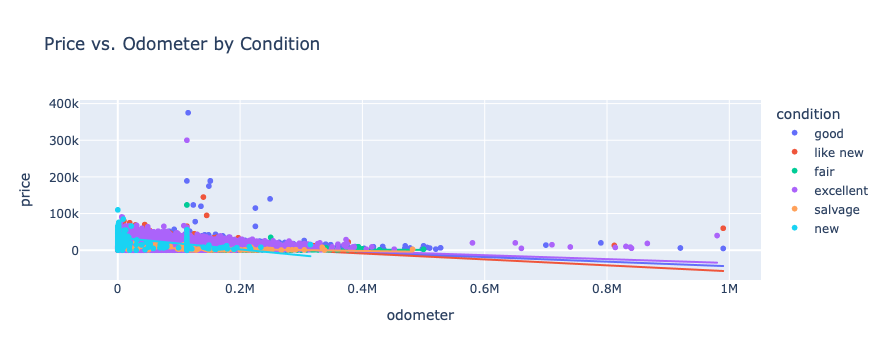

In [31]:
fig_price_odometer = px.scatter(df, x='odometer', y='price', color='condition', trendline='ols', title='Price vs. Odometer by Condition')
fig_price_odometer.show()

### Observation:
- There is a negative correlation between price and odometer readings, indicating that higher mileage cars tend to be cheaper.
- Cars in "excellent" and "new" condition are priced higher even with some mileage.
- "Fair" and "salvage" condition cars are generally priced lower.
- The trendline confirms the negative relationship between odometer reading and price across different conditions.

**Price vs. Model Year**

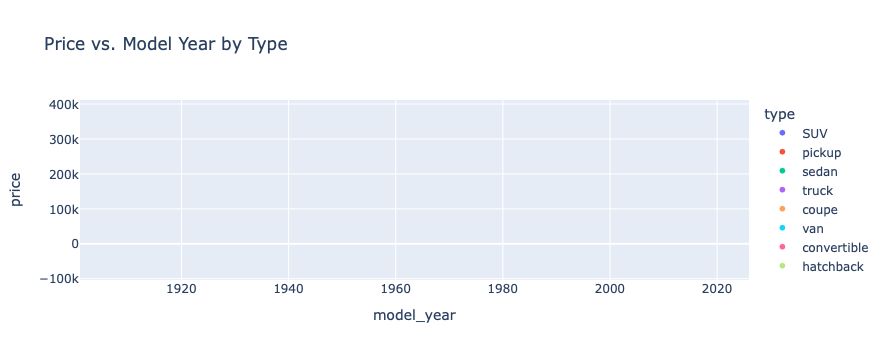

In [56]:
fig_price_model_year = px.scatter(df, x='model_year', y='price', color='type', trendline='ols', title='Price vs. Model Year by Type')
fig_price_model_year.show()

### Observation:
- There is a general trend that newer car models are priced higher.
- Different types of vehicles (SUVs, pickups, sedans, etc.) are distributed across various model years.
- The price of cars increases with newer model years, with some outliers in older model years.
- The trendline indicates a positive relationship between model year and price, confirming that newer models tend to be more expensive.